In [1]:
# use_TPU = False
# if use_TPU:
#   import os
#   assert os.environ['COLAB_TPU_ADDR']

In [2]:
# if use_TPU:
#   !pip install cloud-tpu-client==0.10 torch==1.9.0 https://storage.googleapis.com/tpu-pytorch/wheels/torch_xla-1.9-cp37-cp37m-linux_x86_64.whl

In [3]:
!pip install transformers
# !pip install pytorch_lightning
# !pip install timm

     |████████████████████████████████| 3.5 MB 4.2 MB/s 
     |████████████████████████████████| 67 kB 5.9 MB/s 
     |████████████████████████████████| 895 kB 74.9 MB/s 
     |████████████████████████████████| 596 kB 22.0 MB/s 
     |████████████████████████████████| 6.8 MB 48.5 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [4]:
from transformers import BeitFeatureExtractor, BeitForSemanticSegmentation, BeitConfig, DetrFeatureExtractor, DetrForSegmentation
from PIL import Image
import requests
import torch
import os
import numpy as np
from torch import nn
import torch
import torchvision
import torch.nn.functional as F
from torchvision.datasets.utils import download_url
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torchvision.transforms as tt
from torch.utils.data import random_split
from torchvision.utils import make_grid
from torch.utils.tensorboard import SummaryWriter
import matplotlib
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch.utils.data import random_split
import pickle
import torchvision.models as models
from torch.utils.data.sampler import SubsetRandomSampler
import pandas as pd

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# #!unzip "/content/drive/Shareddrives/Food Analytic/Data/FoodSeg103.zip" -d .
!unzip "/content/drive/MyDrive/Senior Project/FoodSeg103.zip" -d .

Streaming output truncated to the last 5000 lines.
  inflating: ./FoodSeg103/Images/ann_dir/train/00000481.png  
  inflating: ./__MACOSX/FoodSeg103/Images/ann_dir/train/._00000481.png  
  inflating: ./FoodSeg103/Images/ann_dir/train/00001947.png  
  inflating: ./__MACOSX/FoodSeg103/Images/ann_dir/train/._00001947.png  
  inflating: ./FoodSeg103/Images/ann_dir/train/00001774.png  
  inflating: ./__MACOSX/FoodSeg103/Images/ann_dir/train/._00001774.png  
  inflating: ./FoodSeg103/Images/ann_dir/train/00003163.png  
  inflating: ./__MACOSX/FoodSeg103/Images/ann_dir/train/._00003163.png  
  inflating: ./FoodSeg103/Images/ann_dir/train/00003605.png  
  inflating: ./__MACOSX/FoodSeg103/Images/ann_dir/train/._00003605.png  
  inflating: ./FoodSeg103/Images/ann_dir/train/00001012.png  
  inflating: ./__MACOSX/FoodSeg103/Images/ann_dir/train/._00001012.png  
  inflating: ./FoodSeg103/Images/ann_dir/train/00001006.png  
  inflating: ./__MACOSX/FoodSeg103/Images/ann_dir/train/._00001006.png  
  in

In [7]:
# root_path_image = 'C:/Users/Kombangkoe Dias/Downloads/FoodSeg103/FoodSeg103/Images'
# root_path_type = 'C:/Users/Kombangkoe Dias/Downloads/FoodSeg103/FoodSeg103/types'
# root_path = 'C:/Users/Kombangkoe Dias/Downloads/FoodSeg103'
root_path_image = '/content/FoodSeg103/Images'
root_path_type = '/content/FoodSeg103/types'
root_path = '/content/FoodSeg103'
drive_path = '/content/drive/MyDrive/Senior Project'
# root_path_image = '/home/kbd/Desktop/data/FoodSeg103/FoodSeg103/Images'
# root_path_type = '/home/kbd/Desktop/data/FoodSeg103/FoodSeg103/types'
# root_path = '/home/kbd/Desktop/data/FoodSeg103/FoodSeg103'

In [8]:
class Utils:
    def __init__(self):
        self.ingredients, self.ingredients_no_type = self.getIngredients()
        self.colors = self.getColors()
        self.palettes = self.getPalettes()
        self.id2label = self.getid2label()
        self.label2id = self.getlabel2id()
    def getIngredients(self):
        names = ['carbohydrates', 'protein', 'vegetables', 'fruits', 'desserts', 'snacks', 'additives', 'drinks', 'others', 'background']
        ingredients = dict()
        ingredients_no_type = dict()
        for name in names:
            ingredients[name] = {}
            with open(f"{root_path_type}/{name}.txt") as f:
                for line in f:
                    data = line.strip().split()
                    Id = data[0]
                    food_type = ' '.join(data[1:])
                    ingredients[name][int(Id)] = food_type
                    ingredients_no_type[int(Id)] = {"food_type": food_type}
        return ingredients, ingredients_no_type
    def findType(self, label):
        for ingredient in self.ingredients.keys():
            if label in self.ingredients[ingredient].keys():
                return ingredient
        return False
    def combineMask(self, imageData, masks, Ids):
        labels = imageData['labels']
        img = Image.open(imageData['img'])
        start = np.zeros((img.size[1], img.size[0])).astype('uint8')
        for idx, mask in enumerate(masks):
            start[mask == 1] = labels[Ids[idx]]
        start = start.astype('uint8')
        combined_mask = Image.fromarray(start, mode='L')
        return combined_mask
    def getColors(self):
        colors = dict()
        with open(f'{root_path}/colors.txt') as f:
            for line in f:
                line = line.strip().split()
                color = (int(line[1]), int(line[2]), int(line[3]))
                self.ingredients[line[0]]['color'] = color
                colors[line[0]] = color
        return colors
    def getPalettes(self):
        palettes = []
        for i in range(104):
            ingredient_type = self.findType(i)
            color = self.colors[ingredient_type]
            for rgb in color:
                palettes.append(rgb)
        return palettes
    def plotMask(self,imageData, masks=None, Ids=None):            
        image = imageData['img']
        image = Image.open(image)
        image = image.convert('RGBA')
        if masks is not None:
            mask = self.combineMask(imageData, masks, Ids)
        else:
            mask = imageData['mask_dir']
            mask = np.array(Image.open(mask))
            mask = Image.fromarray(mask, mode='L')
        mask.putpalette(self.palettes)
        mask = mask.convert('RGBA')
        
        image_with_mask = Image.blend(image, mask, 0.65)
        return image, mask, image_with_mask
    def getid2label(self):
        id2label = dict()
        for id in self.ingredients_no_type.keys():
          id2label[id] = self.ingredients_no_type[id]['food_type']
        return id2label
    def getlabel2id(self):
        label2id = dict()
        for id, val in self.ingredients_no_type.items():
          label2id[val['food_type']] = id
        return label2id

In [9]:
utils = Utils()

In [10]:
class FoodSeg103Segmentation(torch.utils.data.Dataset):
    def __init__(self,root, train=True, feature_extractor=None, transforms=None):
        if train:
          path = 'train'
        else:
          path = 'test'
        self.root = root
        self.transforms = transforms
        self.imgs = list(sorted(os.listdir(os.path.join(root,f'img_dir/{path}'))))
        self.masks = list(sorted(os.listdir(os.path.join(root, f'ann_dir/{path}'))))
        self.train = train
        self.feature_extractor = feature_extractor
        filtered = [1078,3642,4909]
        if train:
          for idx in filtered:
              self.imgs.pop(idx)
              self.masks.pop(idx)
    def __getitem__(self, idx):
        img_path = os.path.join(self.root, 'img_dir/train' if self.train else 'img_dir/test', self.imgs[idx])
        mask_path = os.path.join(self.root, 'ann_dir/train' if self.train else 'ann_dir/test', self.masks[idx])
        img = Image.open(img_path)
        mask = Image.open(mask_path)
        # import cv2
        # img = cv2.resize(np.array(img), self.imageSize, interpolation=cv2.INTER_NEAREST)
        # mask = cv2.resize(np.array(mask), self.imageSize, interpolation=cv2.INTER_NEAREST)
        # mask = np.array(mask)
        # Ids = np.unique(mask)
        # Ids = Ids[1:]
        # masks = []
        # for id in Ids:
        #     masks.append(mask == id)
        # num_mask = len(Ids)
        # boxes = []
        # for i in range(num_mask):
        #     pos = np.where(masks[i])
        #     xmin = np.min(pos[1])
        #     xmax = np.max(pos[1])
        #     ymin = np.min(pos[0])
        #     ymax = np.max(pos[0])
        #     boxes.append([xmin, ymin, xmax, ymax])
        
        # boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # labels = torch.as_tensor(Ids, dtype=torch.int64)
        # masks = torch.as_tensor(masks, dtype=torch.uint8)
        # image_id = torch.tensor([idx])
        # area = (boxes[:,3] - boxes[:, 1]) * (boxes[:,2] - boxes[:, 0])
        # # iscrowd = torch.zeros((num_mask,), dtype=torch.int64)
        # for a in area:
        #   if a == 0:
        #     return self.__getitem__(idx-1)

        if not self.train:
          return {'img_tensor': torch.tensor(np.array(img)).permute((2,0,1)),'img_np': np.array(img), 
                  'mask_tensor': torch.tensor([np.array(mask)]), 'mask_np': np.array(mask),
                  'img_pil': img, 'mask_pil': mask} # for testing on test dataset

        data = dict()
        data['image'] = img_path
        if self.feature_extractor is not None:
          encoded_inputs = self.feature_extractor(img, mask, return_tensors='pt')
        else:
          return {'pixel_values': np.array(img), 'labels': np.array(mask)}
        # else:
        #   data['target'] = {'boxes': boxes, 'labels': labels, 
        #                   'masks': masks, 'image_id': image_id, 'area': area}
        return {'pixel_values': encoded_inputs['pixel_values'][0,:,:,:], 'labels': encoded_inputs['labels']}
    def __len__(self):
        return len(self.imgs)

In [11]:
feature_extractor = BeitFeatureExtractor(do_resize=True, size=640, resample=Image.NEAREST,align=False, do_center_crop=False, reduce_zero_label=True)
dataset = FoodSeg103Segmentation(root_path_image, feature_extractor=feature_extractor)
dataset_test = FoodSeg103Segmentation(root_path_image, train=False)

In [12]:
dataset[0]['pixel_values'].shape, dataset[0]['labels'].shape

(torch.Size([3, 640, 640]), torch.Size([1, 640, 640]))

In [13]:
dataset_test[0]['img_tensor'].shape, dataset_test[0]['mask_tensor'].shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)


(torch.Size([3, 485, 512]), torch.Size([1, 485, 512]))

In [14]:
dataset_size = len(dataset)
indices = list(range(dataset_size))
split = 500

np.random.seed(42)
np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(val_indices)

train_loader = torch.utils.data.DataLoader(dataset, batch_size=2, 
                                           sampler=train_sampler)
validation_loader = torch.utils.data.DataLoader(dataset, batch_size=1,
                                                sampler=valid_sampler)
test_loader = torch.utils.data.DataLoader(dataset_test, batch_size=1)

In [15]:
for data in tqdm(train_loader):
  labels = data['labels']
  n = np.count_nonzero(np.unique(labels) > 103)
  if n > 0:
    print(np.unique(labels))
    print(n)

100%|██████████| 2240/2240 [02:57<00:00, 12.63it/s]


In [ ]:
dataset_no_feature_extractor = FoodSeg103Segmentation(root_path_image)

In [ ]:
for idx, data in enumerate(tqdm(dataset)):
  labels = data['labels']
  raw = dataset_no_feature_extractor[idx]['labels']
  labels = np.unique(labels)
  raw = np.unique(raw)
  labels = set(labels)
  raw = set(raw)
  
  if not labels.issubset(raw):
    print(np.unique(labels), np.unique(raw))

In [ ]:
for t in tqdm(validation_loader):
  pass

100%|██████████| 32/32 [00:16<00:00,  1.90it/s]


In [ ]:
for t in tqdm(test_loader):
  pass

100%|██████████| 2135/2135 [01:33<00:00, 22.72it/s]


## BEiT

In [15]:
import seaborn as sns
from matplotlib.pyplot import figure
import matplotlib.patches as mpatches

def confusion_matrix_decorator(func):
    def inner(*args, **kwargs):
        beit = args[0].beit
        x = beit.confusionMatrix
        if x is None:
          print(f"no confusion matrix found, function {func.__name__} not available")
          return
        func(*args, **kwargs)
    return inner

class BEiTVisualization():
  def __init__(self, model):
    self.beit = model
    self.palettes = self.generateRandomPalettes()

    print("Visualization class initialized")

  def generateRandomPalettes(self):
    palettes = [255,255,255]
    for i in range(self.beit.model.config.num_labels):
      palette = [np.random.randint(0,255) for i in range(3)]
      palettes += palette
    return palettes

  def predictAndVisualize(self, idx, real_img, real_mask, palettes):
    self.beit.model.eval()
    img = real_img
    mask = np.array(real_mask)
    predicted = self.beit.predict(img)
    accuracy = self.beit.calculateIOU(predicted, mask)
    f, axarr = plt.subplots(1,3, figsize=(20,6))
    plt.subplots_adjust(wspace=0.4)
    f.suptitle(f"image No.{idx} IOU: {accuracy}",fontsize=16)

    predicted_labels = np.unique(predicted)
    predicted_labels_color = [palettes[label*3:label*3+3] for label in predicted_labels]
    #print(predicted_labels)
    #print(predicted_labels_color)

    predicted = Image.fromarray(predicted)
    predicted.putpalette(palettes)
    predicted = predicted.convert('RGBA')

    mask_labels = np.unique(mask)
    mask_labels_color = [palettes[label*3:label*3+3] for label in mask_labels]
    #print(mask_labels)
    #print(mask_labels_color)

    mask = Image.fromarray(mask, mode='L')
    mask.putpalette(palettes)
    mask = mask.convert('RGBA')
    axarr[0].imshow(img)
    axarr[0].title.set_text('test image')
    box = axarr[0].get_position()
    axarr[0].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    axarr[1].imshow(mask)
    axarr[1].title.set_text('ground truth')
    real_patches = []
    for idx, color in enumerate(mask_labels_color):
      color = list(np.array(color)/255)
      patch = mpatches.Patch(color=color, label=self.beit.model.config.id2label[mask_labels[idx]])
      real_patches.append(patch)
    box = axarr[1].get_position()
    axarr[1].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    axarr[1].legend(handles=real_patches,loc='center left', bbox_to_anchor=(1, 0.5))

    axarr[2].imshow(predicted, cmap='gray')
    axarr[2].title.set_text('prediction')
    predicted_patches = []
    for idx, color in enumerate(predicted_labels_color):
      color = list(np.array(color)/255)
      patch = mpatches.Patch(color=color, label=self.beit.model.config.id2label[predicted_labels[idx]])
      predicted_patches.append(patch)
    box = axarr[2].get_position()
    axarr[2].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    axarr[2].legend(handles=predicted_patches,loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()
    print()

  def predictTestSetAndVisualize(self, random_n=0, indices=[]):
    # randomly predict
    if random_n != 0:
      for i in range(random_n):
        idx = np.random.randint(0, len(dataset_test))
        self.predictAndVisualize(idx, self.beit.dataset_test[idx]['img_pil'], self.beit.dataset_test[idx]['mask_np'], self.palettes)
    # predict some specific image
    elif len(indices) != 0:
      for i in indices:
        self.predictAndVisualize(i, self.beit.dataset_test[i]['img_pil'], self.beit.dataset_test[i]['mask_np'], self.palettes)
    # predict all
    else:
      for i in range(len(dataset_test)):
        self.predictAndVisualize(i, self.beit.dataset_test[i]['img_pil'], self.beit.dataset_test[i]['mask_np'], self.palettes)

  @confusion_matrix_decorator
  def plotTruePositiveClassAccuracy(self):
    RsptR = []
    RsptC = []
    for column in self.beit.confusionMatrixRsptR.columns[:-1]:
      valR = self.beit.confusionMatrixRsptR[column].loc[column]
      valC = self.beit.confusionMatrixRsptC[column].loc[column]
      if np.isnan(valR):
        valR = 0
      if np.isnan(valC):
        valC = 0
      RsptR.append((column, valR))
      RsptC.append((column, valC))

    confusionMatrixRsptRSort = sorted(RsptR, key=lambda x: x[1], reverse=True)
    confusionMatrixRsptCSort = sorted(RsptC, key=lambda x: x[1], reverse=True)

    confusionMatrixRsptRSortColumn = list(map(lambda x: x[0], confusionMatrixRsptRSort))
    confusionMatrixRsptCSortColumn = list(map(lambda x: x[0], confusionMatrixRsptCSort))
    confusionMatrixRsptRSortValue = list(map(lambda x: x[1], confusionMatrixRsptRSort))
    confusionMatrixRsptCSortValue = list(map(lambda x: x[1], confusionMatrixRsptCSort))

    data = [(confusionMatrixRsptRSortValue, confusionMatrixRsptRSortColumn, "True Positive Accuracy of classes with respect to number of predicted labels"), 
            (confusionMatrixRsptCSortValue,confusionMatrixRsptCSortColumn, "True Positive Accuracy of classes with respect to number of ground truth labels")]


    for values, columns, title in data:
      figure(figsize=(17, 10), dpi=80)
      ax = plt.gca()
      bar_plot = plt.bar([idx for idx in range(len(values))], values, color='m')
      for idx, rect in enumerate(bar_plot):
        height = rect.get_height()
        if height > 1e-3:
          height = float(format(height,".3f"))
        ax.text(rect.get_x() + rect.get_width()/2., height+0.02,
                height,
                ha='center', va='bottom', size='small', rotation=90)
      plt.xticks([idx for idx in range(len(columns))], columns, rotation='vertical')
      plt.ylabel("true positive accuracy")
      plt.xlabel("classes")
      plt.title(title)
      plt.show()
      print()

  @confusion_matrix_decorator
  def plotHeatMapOfConfusionMatrix(self):
      data = [(self.beit.confusionMatrixRsptR, "Heatmap of confusion matrix with respect to number of prediction labels"), 
              (self.beit.confusionMatrixRsptC, "Heatmap of confusion matrix with respect to number of ground truth labels")]
      for frame, title in data:
        with sns.axes_style("white"):
          f, ax = plt.subplots(figsize=(30, 30))
          frame = frame.fillna(0)
          frame = frame[frame.columns[:-1]]
          frame = frame.loc[frame.index[:-1]]
          ax = sns.heatmap(frame,xticklabels=True, yticklabels=True, cmap="Blues", square=True)
          ax.xaxis.set_ticks_position('top')
          ax.xaxis.set_label_position('top')
          ax.tick_params(labelsize=8)
          plt.xticks(rotation="vertical")
          plt.title(title, fontsize=20)
          plt.xlabel("prediction", fontsize=16)
          plt.ylabel("ground truth", fontsize=16)
          plt.show()
          print()

In [16]:
class BEiTEvaluation():
  def __init__(self, model):
    self.beit = model

    print("Evaluation class initialized")

  def evaluate(self, try_for_test=False):
    self.beit.model.eval()
    sum_accuracy = 0
    if try_for_test:
      dataloader = self.beit.test_loader
    else:
      dataloader = self.beit.val_loader
    for batch in tqdm(dataloader):
      pixel_values = batch['pixel_values'].to(self.beit.device)
      labels = batch['labels'][:,0,:,:]
      labels = labels.to(self.beit.device)
      # print(pixel_values.shape)
      # print(labels.shape)
      outputs = self.beit.model(pixel_values=pixel_values, labels=labels)
      # interpolate the result
      upsampled_logits = nn.functional.interpolate(outputs.logits, size=labels.shape[-2:], mode="bilinear", align_corners=False)
      predicted = upsampled_logits.argmax(dim=1)

      mask = (labels != 255) # we don't include the background class in the accuracy calculation
      pred_labels = predicted[mask].detach().cpu().numpy()
      true_labels = labels[mask].detach().cpu().numpy()
      #print(np.unique(pred_labels), pred_labels.shape)
      #print(np.unique(true_labels), true_labels.shape)
      accuracy = self.beit.calculateIOU(pred_labels, true_labels)
      sum_accuracy += accuracy
    print("mIOU:", sum_accuracy / len(dataloader))
    return sum_accuracy / len(dataloader)

  def evaluate_on_test_dataset(self):
    self.beit.model.eval()
    sum_accuracy = 0
    accuracies = []
    with tqdm(self.beit.dataset_test) as pbar_object:
      for batch in pbar_object:
        img = batch['img_pil']
        mask = batch['mask_np']
        predicted = self.beit.predict(img)
        accuracy = self.beit.calculateIOU(predicted, mask)
        pbar_object.set_postfix(accuracy=accuracy)
        accuracies.append(accuracy)  
        sum_accuracy += accuracy
      self.beit.test_dataset_mIOU = sum_accuracy / len(self.beit.dataset_test)
      self.beit.accuracies = accuracies
      with open(self.beit.accuraciesPath, 'wb') as f:
        pickle.dump(accuracies, f, protocol=pickle.HIGHEST_PROTOCOL)
      print("mIOU:", sum_accuracy / len(self.beit.dataset_test))
      return sum_accuracy / len(self.beit.dataset_test), accuracies


In [17]:
from transformers import AdamW
import torch
from torch import nn 
from sklearn.metrics import accuracy_score
from tqdm.notebook import tqdm
from torch.utils.tensorboard import SummaryWriter

class BEiTSegmentationTrainWrapper():
  def __init__(self,feature_extractor, train_loader, val_loader, test_loader, dataset_test):
    self.model = BeitForSemanticSegmentation.from_pretrained('microsoft/beit-base-finetuned-ade-640-640', ignore_mismatched_sizes=True, num_labels=104, id2label=utils.id2label, label2id=utils.label2id)
    self.feature_extractor = feature_extractor
    self.model_path = f"{drive_path}/BEiTSegmentation/state_dict/BEiTSegmentation_best.pth"
    self.tensorboard_path = f"{drive_path}/BEiTSegmentation/tensorboard_logs/"
    self.confusionMatrixPath = f"{drive_path}/BEiTSegmentation/confusionMatrix1.csv"
    self.accuraciesPath = f"{drive_path}/BEiTSegmentation/accuracies1.pickle"

    self.train_loader = train_loader
    self.val_loader = val_loader
    self.test_loader = test_loader
    self.dataset_test = dataset_test

    self.highest_accuracy = 0
    self.confusionMatrix = None

    self.visualization = BEiTVisualization(self)
    self.evaluation = BEiTEvaluation(self)
    self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


    self.freezeBEiTModelLayer()
    self.prepare_for_continue_training()
    self.model.to(self.device)
    self.writer = None
    self.loadConfusionMatrix()
    self.loadAccuraciesArray()

  def prepare_for_continue_training(self):
    with open(f"{drive_path}/BEiTSegmentation/iterations.txt", 'r') as f:
      self.iteration = int(f.readline().strip())
      print("current iteration:", self.iteration)
    try:
      self.model.load_state_dict(torch.load(self.model_path))
      print("loaded the best model's state dict")
    except:
      print("using the default BEiTForSemanticSegmentation Model")
  
  def freezeBEiTModelLayer(self):
    for idx, child in enumerate(self.model.children()):
      if idx == 0: # freeze the BeitModel
        for param in child.parameters():
          param.requires_grad = False
    count = sum(p.numel() for p in self.model.parameters() if p.requires_grad)
    print("Total trainable parameters:", count)

  def setup_training(self, epochs=10):
    self.optimizer = AdamW(self.model.parameters(), lr=0.00006) 
    self.epochs = epochs

  def finetune(self):
    # create the writer on the same log_dir 
    # in case the iteration is continuing, then might be that the same log file will be used.
    if self.writer is None:
      self.writer = SummaryWriter(log_dir=self.tensorboard_path)
    self.highest_accuracy = self.evaluation.evaluate() # generate the previous highest accuracy.
    for epoch in range(self.epochs):  # loop over the dataset multiple times
      self.model.train()
      print("Epoch:", epoch)
      with tqdm(self.train_loader) as pbar_object:
        for batch in pbar_object:
            pixel_values = batch["pixel_values"].to(self.device)
            labels = batch['labels'][:,0,:,:]
            labels = labels.to(self.device)
            #print(pixel_values.shape, labels.shape)
            self.optimizer.zero_grad()

            outputs = self.model(pixel_values=pixel_values, labels=labels)

            loss = outputs.loss
            pbar_object.set_postfix(loss=loss.item(), iteration=self.iteration)
            # TODO : add tensorboard
            loss.backward()
            self.optimizer.step()
            self.iteration += 1

            # logging
            with open(f"{drive_path}/BEiTSegmentation/iterations.txt", 'w') as f:
              f.write(str(self.iteration))
              f.close()
            self.writer.add_scalar('Loss/train', loss.item(), self.iteration)
      accuracy = self.evaluation.evaluate()
      self.writer.add_scalar('Accuracy/test', accuracy, self.iteration)
      if accuracy > self.highest_accuracy:
        self.highest_accuracy = accuracy
        torch.save(self.model.state_dict(), self.model_path)
    self.evaluation.evaluate_on_test_dataset()

  def predict(self, img):
    inputs = self.feature_extractor(img, return_tensors='pt')
    pixel_values = [v.numpy() for v in inputs['pixel_values']]
    pixel_values = torch.tensor(pixel_values)
    pixel_values = pixel_values.to(self.device)
    outputs = self.model(pixel_values)
    upsampled_logits = nn.functional.interpolate(outputs.logits, size=(img.size[1],img.size[0]), mode="bilinear", align_corners=False)
    predicted = upsampled_logits.argmax(dim=1)
    return predicted[0].cpu().numpy().astype(np.uint8)

  def generateConfusionMatrix(self):
    self.model.eval()
    labels = [self.model.config.id2label[i] for i in range(104)]
    self.confusionMatrix = [[np.nan for i in range(104)] for j in range(104)]
    for batch in tqdm(self.dataset_test):
      img = batch['img_pil']
      mask = batch['mask_np']
      predicted = self.predict(img)
      for i in range(predicted.shape[0]):
        for j in range(predicted.shape[1]):
          predict_label = predicted[i][j]
          real_label = mask[i][j]
          if np.isnan(self.confusionMatrix[real_label][predict_label]):
            self.confusionMatrix[real_label][predict_label] = 1
          else:
            self.confusionMatrix[real_label][predict_label] += 1
    num_labels = self.model.config.num_labels
    labels = [self.model.config.id2label[idx] for idx in range(num_labels)]
    self.confusionMatrix = pd.DataFrame(self.confusionMatrix, index=labels, columns=labels)
    totalC = self.confusionMatrix.sum(axis=1)
    totalR = self.confusionMatrix.sum(axis=0)
    self.confusionMatrix.loc['totalR'] = totalR
    totalC.loc['totalR'] = totalR.sum()
    self.confusionMatrix['totalC'] = totalC
    self.confusionMatrix.to_csv(self.confusionMatrixPath)
    
  def loadConfusionMatrix(self):
    try:
      self.confusionMatrix = pd.read_csv(self.confusionMatrixPath, index_col=0)
      print("Loaded the confusion matrix")
      self.calculateTwoConfusionMatrix()
    except:
      print("No pickle file for confusion matrix")

  def calculateTwoConfusionMatrix(self):
    if self.confusionMatrix is not None:
      self.confusionMatrixRsptR = self.confusionMatrix.divide(self.confusionMatrix.loc['totalR'],axis='columns')
      self.confusionMatrixRsptC = self.confusionMatrix.divide(self.confusionMatrix['totalC'], axis='index')
      print("created the respective confusion matrix")

  def loadAccuraciesArray(self):
    try:
      with open(self.accuraciesPath, 'rb') as f:
        accuracies = pickle.load(f)
        print("Loaded accuracies")
    except:
      print("no accuracies file found")
  

  def calculateIOU(self, pred_labels, true_labels):
    condition1 = pred_labels != 0
    condition2 = pred_labels == true_labels
    Intersection = np.count_nonzero(condition1 & condition2)
    Union = np.count_nonzero(pred_labels | true_labels)
    #print("Intersection:",Intersection)
    #print("Union:",Union)
    IOU = Intersection / Union
    #print("IOU:",IOU)
    return IOU

  def resetIterations(self, itr = 0):
    with open(f"{drive_path}/BEiTSegmentation/iterations.txt", 'w') as f:
      f.write(str(itr))
      f.close()
      self.iteration = itr
    



In [18]:
BEiT = BEiTSegmentationTrainWrapper(feature_extractor,train_loader, validation_loader, test_loader, dataset_test)

Downloading:   0%|          | 0.00/6.80k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/858M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Some weights of BeitForSemanticSegmentation were not initialized from the model checkpoint at microsoft/beit-base-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([104, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([104]) in the model instantiated
- auxiliary_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([104, 256, 1, 1]) in the model instantiated
- auxiliary_head.classifier.bias: found shape torch.Size([15

Visualization class initialized
Evaluation class initialized
Total trainable parameters: 76806608
current iteration: 22400
loaded the best model's state dict
Loaded the confusion matrix
created the respective confusion matrix
Loaded accuracies


### finetune the model

In [ ]:
#BEiT.setup_training(epochs=20)

In [ ]:
#BEiT.resetIterations() # only for start new training

In [ ]:
#BEiT.finetune()

### evaluate the model

In [34]:
BEiT.evaluation.evaluate()

  0%|          | 0/500 [00:00<?, ?it/s]

mIOU: 0.622341831872754


0.622341831872754

In [323]:
mIOU, accuracies = BEiT.evaluation.evaluate_on_test_dataset()
print(mIOU)

  0%|          | 0/2135 [00:00<?, ?it/s]

mIOU: 0.5969124662444362
0.5969124662444362


### Visualize the results

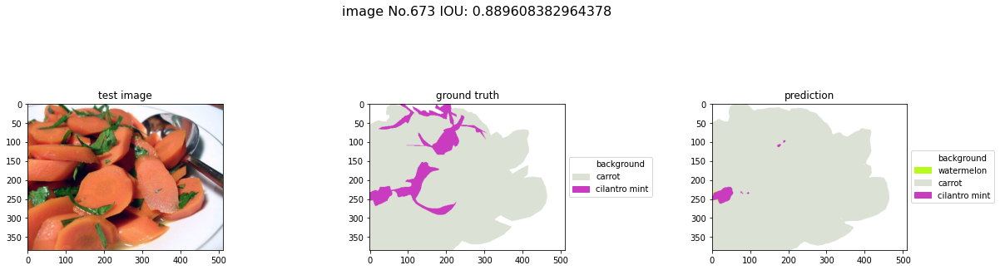

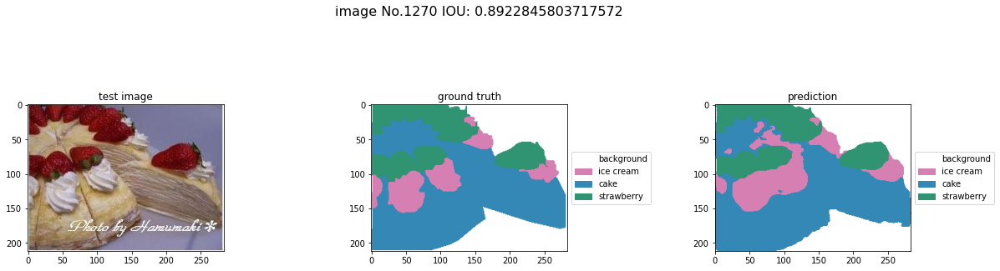

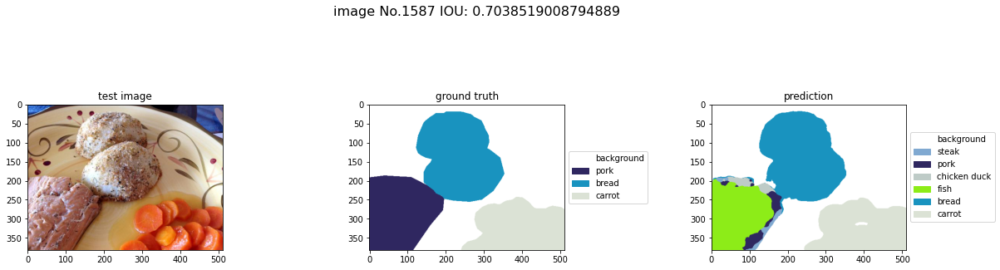

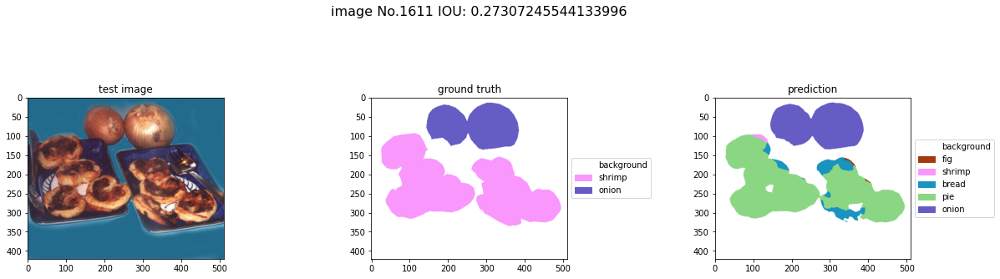

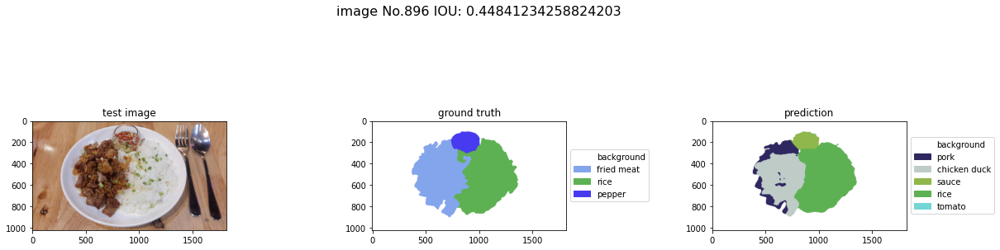

...

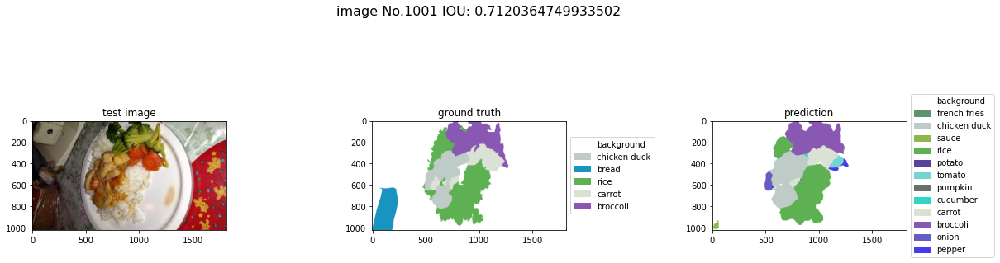

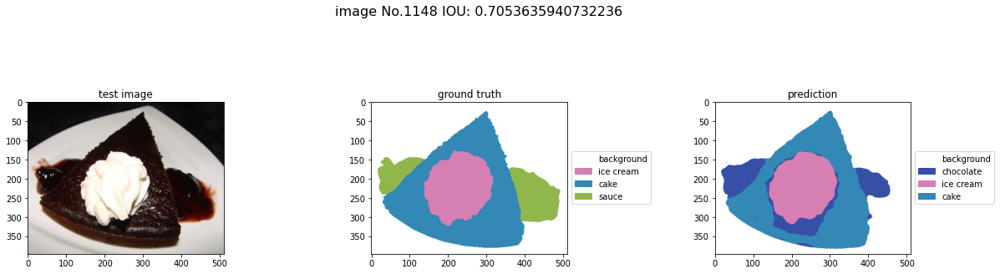

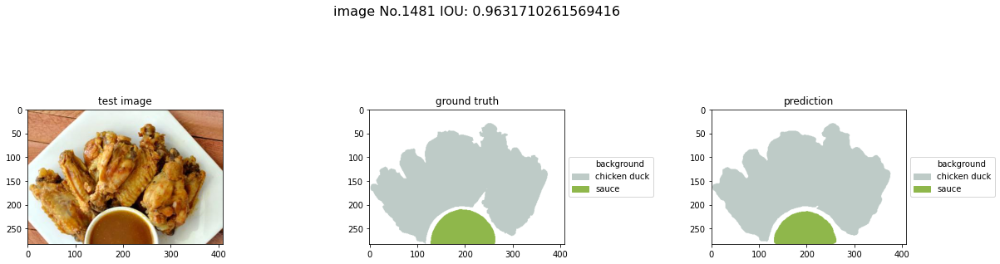

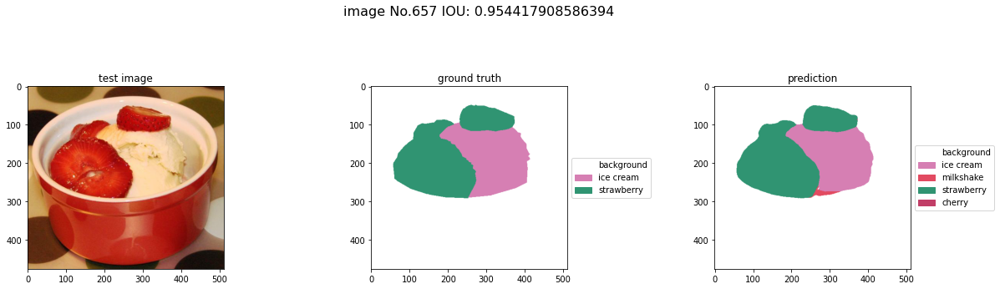

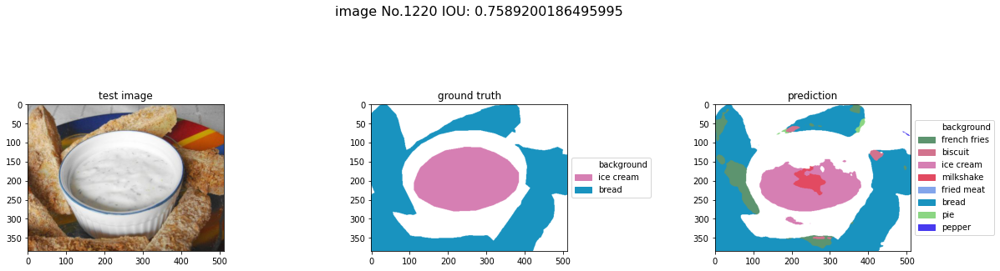

In [19]:
BEiT.visualization.predictTestSetAndVisualize(random_n=100)

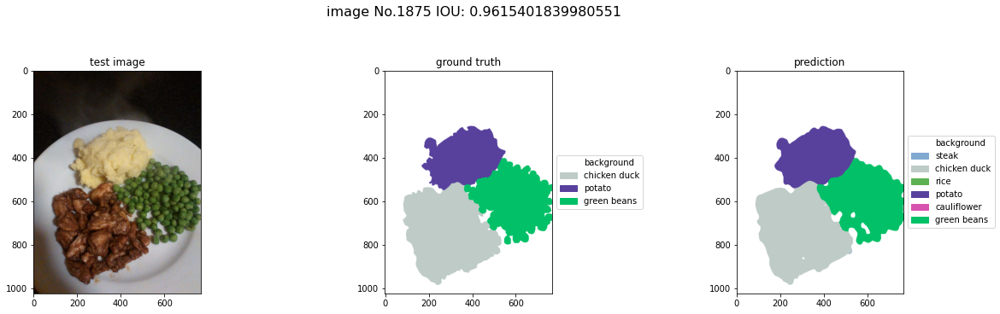

In [20]:
BEiT.visualization.predictTestSetAndVisualize(indices=[1875])

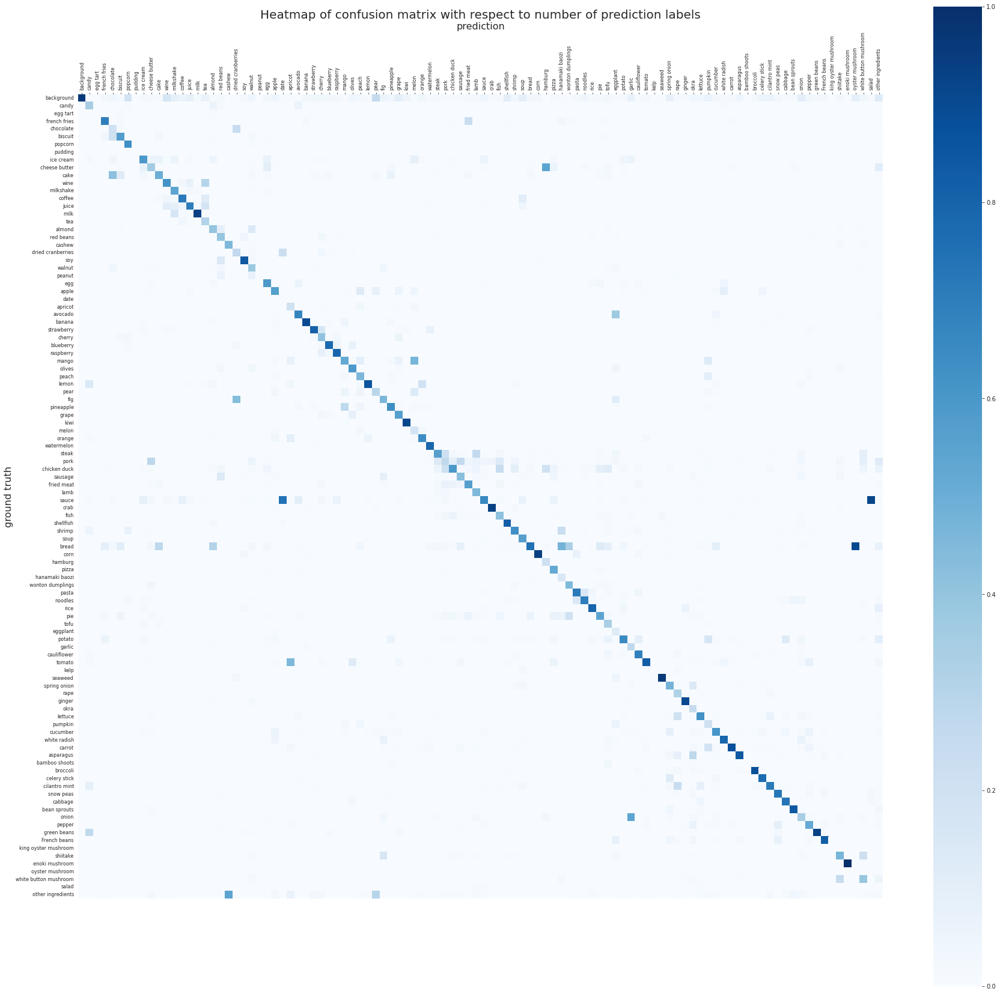

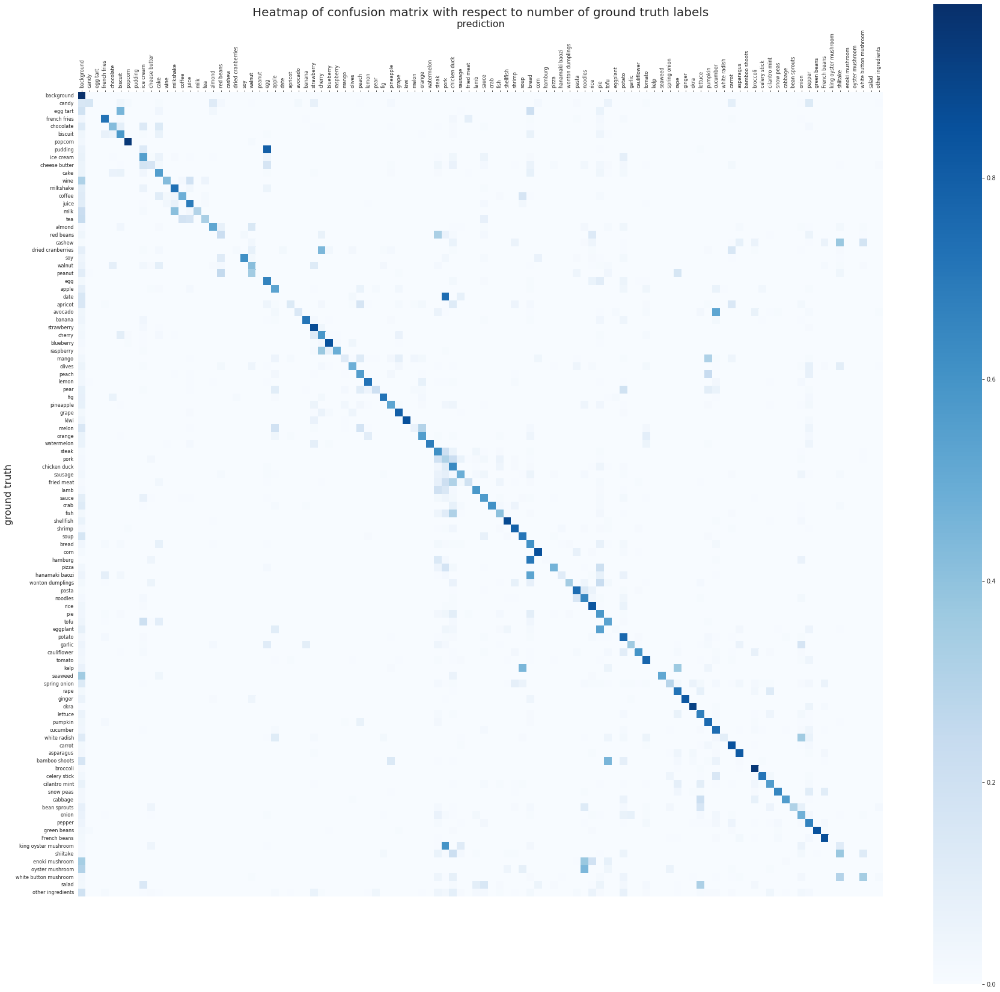

In [124]:
BEiT.visualization.plotHeatMapOfConfusionMatrix()

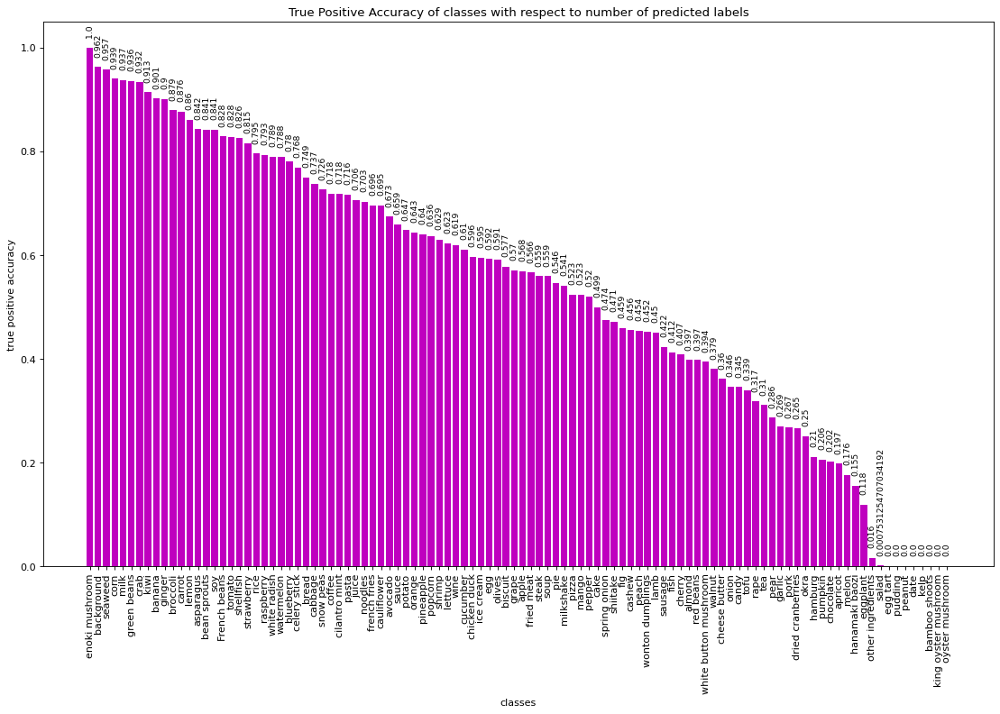

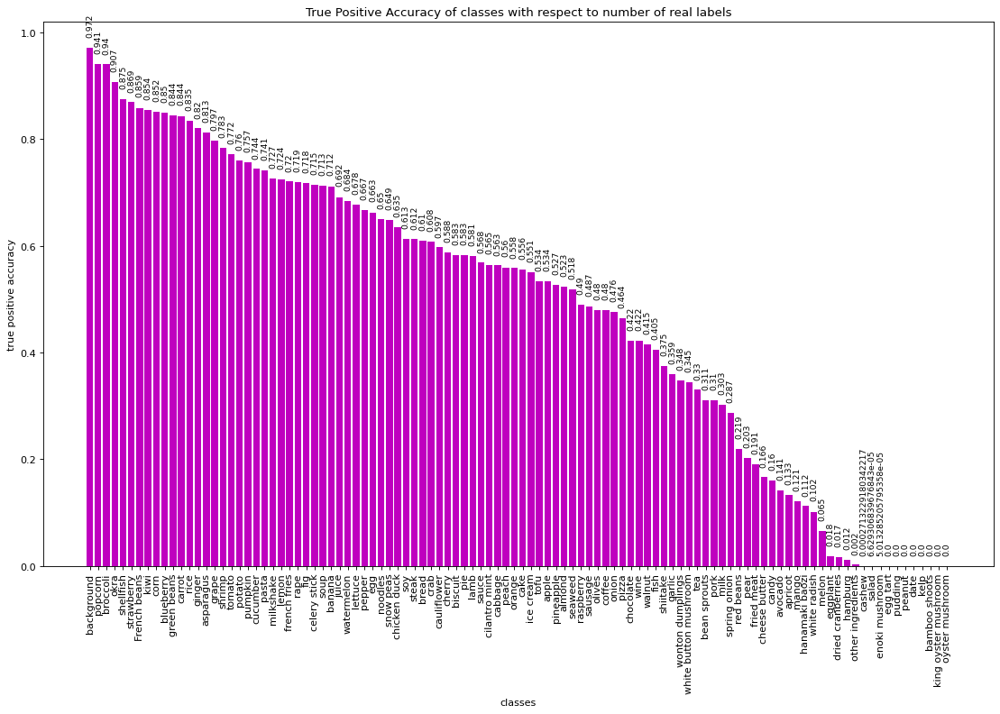

In [68]:
BEiT.visualization.plotTruePositiveClassAccuracy()